# Importing Libraries

In [1]:
import random
import os
import numpy as np
import tensorflow as tf
import pandas as pd
from sklearn.model_selection import train_test_split
import seaborn as sns
import tensorflow_docs as tfdocs
import tensorflow_docs.modeling
from tensorflow.keras.callbacks import ModelCheckpoint
import keras.models
from tensorflow.keras.models import Sequential
from keras.layers import Activation, Dense, BatchNormalization, Dropout
from tensorflow.keras import optimizers
import tensorflow_docs.plots
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
import itertools
import optuna

# Importing Datasets

In [2]:
ANN_DS=pd.read_csv('ANN_dataset_10K/ANN.csv')

# Inspecting Datasets

In [3]:
ANN_DS.head()

,Wn,HTE,I,h,Qc/A,Th,Tc
0,7.5,3.2,16.0,3000,14400,298.225110,327.033621
1,5.5,2.8,27.0,8500,18200,295.987849,337.935540
2,7.8,3.8,1.0,100,2600,319.000490,330.691621
3,5.0,0.5,13.5,3500,11200,296.419181,304.348465
4,7.7,1.7,10.5,8600,7400,294.040030,299.088067


In [4]:
ANN_DS.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Wn      10000 non-null  float64
 1   HTE     10000 non-null  float64
 2   I       10000 non-null  float64
 3   h       10000 non-null  int64  
 4   Qc/A    10000 non-null  int64  
 5   Th      10000 non-null  float64
 6   Tc      10000 non-null  float64
dtypes: float64(5), int64(2)
memory usage: 547.0 KB


In [5]:
ANN_DS.describe()

,Wn,HTE,I,h,Qc/A,Th,Tc
count,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,6.029770,2.504710,15.569550,5047.880000,10375.240000,300.158428,323.469807
std,1.189201,1.155245,8.528878,2889.547448,5507.237049,20.982015,52.493511
min,4.000000,0.500000,1.000000,100.000000,1000.000000,293.304207,233.168502
25%,5.000000,1.500000,8.500000,2600.000000,5600.000000,294.675214,290.288629
50%,6.100000,2.500000,15.500000,5100.000000,10400.000000,295.679480,311.977233
75%,7.100000,3.500000,23.000000,7600.000000,15000.000000,298.070926,343.413456
max,8.000000,4.500000,30.000000,10000.000000,20000.000000,654.143239,697.337621


In [6]:
print(ANN_DS.shape)

(10000, 7)


In [7]:
ANN_DS.isnull().sum()

Wn      0
HTE     0
I       0
h       0
Qc/A    0
Th      0
Tc      0
dtype: int64

# Splitting the Datasets

In [8]:
ANN_train,ANN_test= train_test_split(ANN_DS,test_size=0.2, random_state=42)

In [9]:
ANN_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8000 entries, 9254 to 7270
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Wn      8000 non-null   float64
 1   HTE     8000 non-null   float64
 2   I       8000 non-null   float64
 3   h       8000 non-null   int64  
 4   Qc/A    8000 non-null   int64  
 5   Th      8000 non-null   float64
 6   Tc      8000 non-null   float64
dtypes: float64(5), int64(2)
memory usage: 500.0 KB


In [10]:
ANN_test.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2000 entries, 6252 to 6929
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Wn      2000 non-null   float64
 1   HTE     2000 non-null   float64
 2   I       2000 non-null   float64
 3   h       2000 non-null   int64  
 4   Qc/A    2000 non-null   int64  
 5   Th      2000 non-null   float64
 6   Tc      2000 non-null   float64
dtypes: float64(5), int64(2)
memory usage: 125.0 KB


In [11]:
ANN_final_test,ANN_validation=train_test_split(ANN_test,test_size=0.5,random_state=42)

In [12]:
ANN_final_test.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1000 entries, 5050 to 6543
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Wn      1000 non-null   float64
 1   HTE     1000 non-null   float64
 2   I       1000 non-null   float64
 3   h       1000 non-null   int64  
 4   Qc/A    1000 non-null   int64  
 5   Th      1000 non-null   float64
 6   Tc      1000 non-null   float64
dtypes: float64(5), int64(2)
memory usage: 62.5 KB


In [13]:
ANN_validation.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1000 entries, 4343 to 2908
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Wn      1000 non-null   float64
 1   HTE     1000 non-null   float64
 2   I       1000 non-null   float64
 3   h       1000 non-null   int64  
 4   Qc/A    1000 non-null   int64  
 5   Th      1000 non-null   float64
 6   Tc      1000 non-null   float64
dtypes: float64(5), int64(2)
memory usage: 62.5 KB


# Drop the coloumns Th and Tc 

In [14]:
ANN_train_final=ANN_train.drop(["Th","Tc"],axis=1)
ANN_test_final=ANN_final_test.drop(["Th","Tc"],axis=1)
ANN_validation_final=ANN_validation.drop(["Th","Tc"],axis=1)

# Pairplots and Histograms

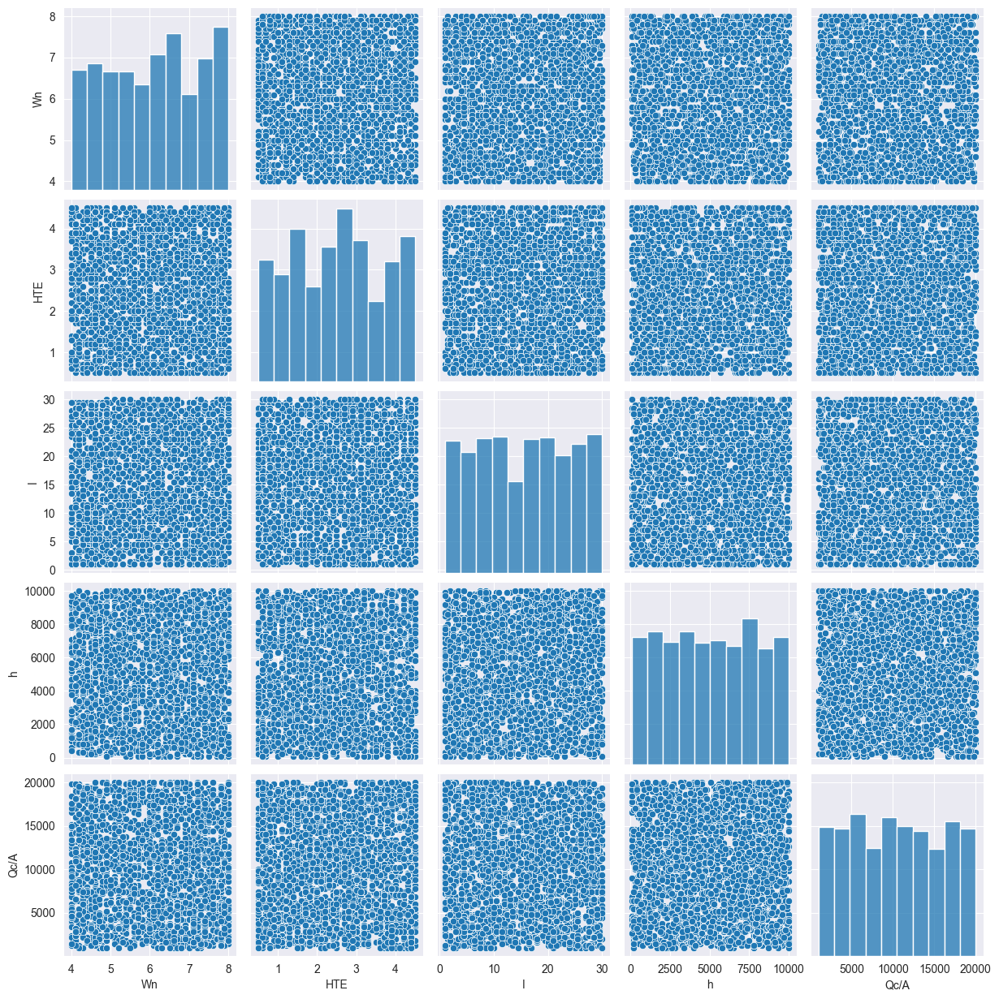

In [15]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set seaborn style
sns.set_style('darkgrid')

# Create pairplot with 10 bins
pairplot = sns.pairplot(ANN_train_final, diag_kws={'bins': 10})

# Save the pairplot as a PNG file
pairplot.savefig('graphs/pairplot.png')

# Show the pairplot
plt.show()


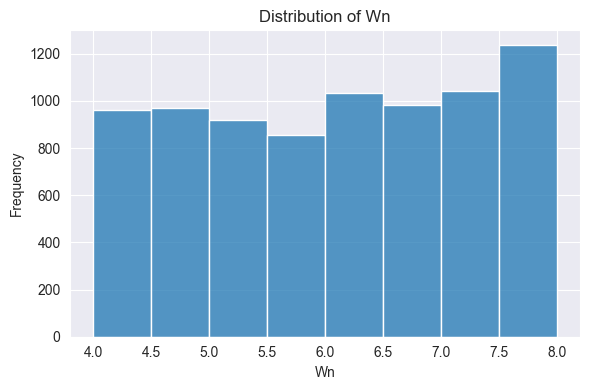

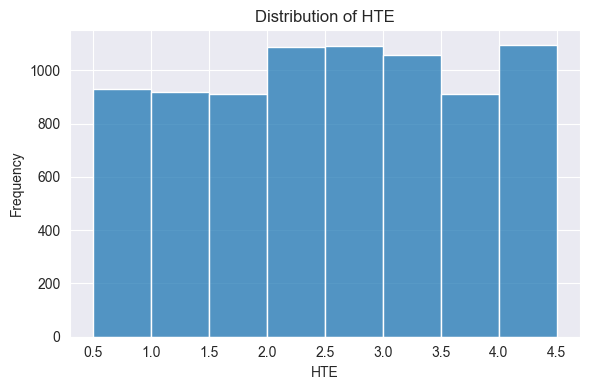

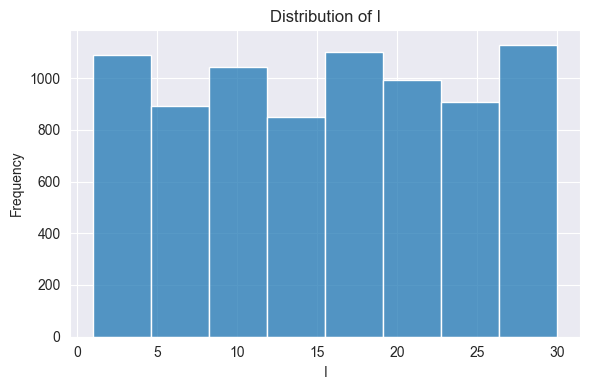

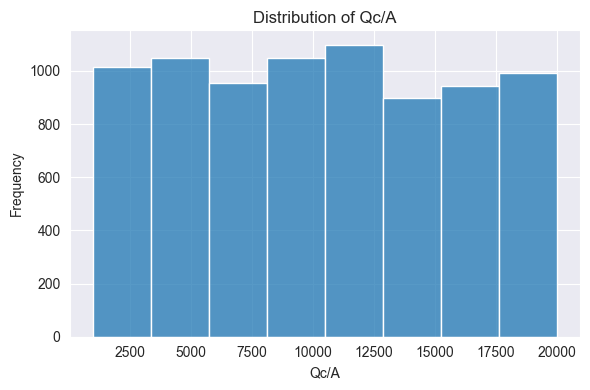

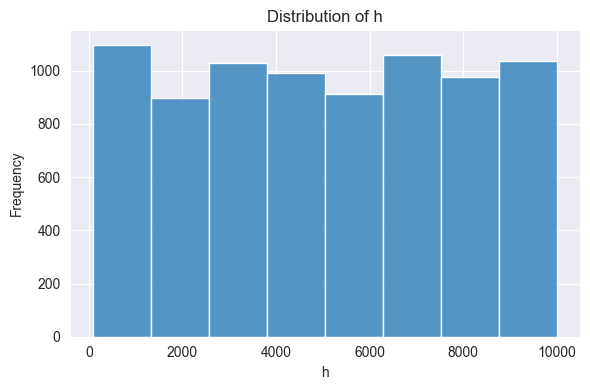

In [16]:
import os
import seaborn as sns
import matplotlib.pyplot as plt

# Set seaborn style
sns.set_style('darkgrid')

# Define the variables to plot
variables = ["Wn", "HTE", "I", "Qc/A", "h"]

# Create the directory if it doesn't exist
os.makedirs('graphs', exist_ok=True)

# Create separate plots for each variable
for variable in variables:
    plt.figure(figsize=(6, 4))  # Adjust the figure size as needed
    sns.histplot(ANN_train_final[variable], bins=8, kde=False)  # Set bins to 44
    plt.title(f'Distribution of {variable}')
    plt.xlabel(variable)
    plt.ylabel('Frequency')
    plt.tight_layout()  # Adjust layout
    # Replace '/' with '_' in the filename
    filename = f'graphs/distplot_{variable.replace("/", "_")}.png'
    plt.savefig(filename)  # Save each plot separately

    # Show each plot
    plt.show()


# Creating Datasets for Labels

In [15]:
ANN_train_labels = ANN_train.drop(["Wn","HTE","I","h","Qc/A"],axis=1)
ANN_test_labels = ANN_final_test.drop(["Wn","HTE","I","h","Qc/A"],axis=1)
ANN_validation_labels = ANN_validation.drop(["Wn","HTE","I","h","Qc/A"],axis=1)

# Put the Datasets through a Min Max Scaler

In [16]:
scaler=MinMaxScaler().fit(ANN_train_final)
ANN_train_scaled=scaler.transform(ANN_train_final)
ANN_test_scaled=scaler.transform(ANN_test_final)
ANN_validation_scaled=scaler.transform(ANN_validation_final)

In [17]:
ANN_train_scaled_df=pd.DataFrame(ANN_train_scaled,columns=["Wn","HTE","I","h","Qc/A"])
ANN_test_scaled_df=pd.DataFrame(ANN_test_scaled,columns=["Wn","HTE","I","h","Qc/A"])
ANN_validation_scaled_df=pd.DataFrame(ANN_validation_scaled,columns=["Wn","HTE","I","h","Qc/A"])

# Inspect the scaled Datasets

In [18]:
ANN_train_scaled_df.describe()

,Wn,HTE,I,h,Qc/A
count,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000
mean,0.509172,0.500884,0.501683,0.498615,0.493867
std,0.297446,0.288363,0.294744,0.292020,0.290162
min,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.250000,0.250000,0.258621,0.252525,0.242105
50%,0.525000,0.500000,0.500000,0.494949,0.494737
75%,0.775000,0.750000,0.758621,0.757576,0.747368
max,1.000000,1.000000,1.000000,1.000000,1.000000


# Defining the ANN Architecture

In [19]:
#setting the value of seeds
seed_value = 42
random.seed(seed_value)
os.environ['PYTHONHASHSEED'] = str(seed_value)
np.random.seed(seed_value)
tf.random.set_seed(seed_value)

In [20]:
import tensorflow as tf

# Define the function to create the ANN model with specified hyperparameters
def create_model(num_hidden_layers, num_neurons, alpha=0.001, beta1=0.9, beta2=0.999, epsilon=1e-8):
    model = tf.keras.models.Sequential()
    model.add(tf.keras.layers.Dense(5, input_shape=(ANN_train_scaled_df.shape[1],)))
    for _ in range(num_hidden_layers):
        model.add(tf.keras.layers.Dense(num_neurons, activation='relu'))
    model.add(tf.keras.layers.Dense(2))
    
    # Define the Adam optimizer with specified parameters
    optimizer = tf.keras.optimizers.Adam(
        learning_rate=alpha,
        beta_1=beta1,
        beta_2=beta2,
        epsilon=epsilon
    )
    
    model.compile(loss='mse', optimizer=optimizer, metrics=['mse'])
    return model

# Define the objective function
def objective(trial):
    # Sample hyperparameters
    num_hidden_layers = trial.suggest_int('num_hidden_layers', 1, 4)
    num_neurons = trial.suggest_int('num_neurons', 100, 300)
    batch_size = trial.suggest_categorical('batch_size', [16, 32, 64])
    epochs = 2000 

    # Create and train the model
    model = create_model(num_hidden_layers, num_neurons)
    
    history = model.fit(
        ANN_train_scaled_df, ANN_train_labels,
        epochs=epochs,
        batch_size=batch_size,
        validation_data=(ANN_validation_scaled_df, ANN_validation_labels),
        verbose=0
    )

    # Evaluate the model
    mse_score = model.evaluate(ANN_train_scaled_df, ANN_train_labels)[0]
    return mse_score


# Optuna

In [23]:
# Define the search space
study = optuna.create_study(direction='minimize',sampler=optuna.samplers.RandomSampler(42))


[I 2024-02-29 15:27:40,986] A new study created in memory with name: no-name-361c0c21-f77b-431e-b609-9c9efadce507


In [24]:
with tf.device('/GPU:0'):
    study.optimize(objective, n_trials=10)

250/250 [==============================] - 0s 959us/step - loss: 0.2897 - mse: 0.2897


[I 2024-02-29 15:46:39,704] Trial 0 finished with value: 0.2897220551967621 and parameters: {'num_hidden_layers': 2, 'num_neurons': 291, 'batch_size': 16}. Best is trial 0 with value: 0.2897220551967621.


250/250 [==============================] - 0s 862us/step - loss: 4.5324 - mse: 4.5324


[I 2024-02-29 15:59:17,644] Trial 1 finished with value: 4.532427787780762 and parameters: {'num_hidden_layers': 1, 'num_neurons': 111, 'batch_size': 16}. Best is trial 0 with value: 0.2897220551967621.


250/250 [==============================] - 0s 839us/step - loss: 1.6301 - mse: 1.6301


[I 2024-02-29 16:12:09,828] Trial 2 finished with value: 1.6301074028015137 and parameters: {'num_hidden_layers': 1, 'num_neurons': 294, 'batch_size': 16}. Best is trial 0 with value: 0.2897220551967621.


250/250 [==============================] - 0s 837us/step - loss: 1.9853 - mse: 1.9853


[I 2024-02-29 16:24:46,406] Trial 3 finished with value: 1.9852689504623413 and parameters: {'num_hidden_layers': 1, 'num_neurons': 161, 'batch_size': 16}. Best is trial 0 with value: 0.2897220551967621.


250/250 [==============================] - 0s 819us/step - loss: 0.7437 - mse: 0.7437


[I 2024-02-29 16:29:35,253] Trial 4 finished with value: 0.7437417507171631 and parameters: {'num_hidden_layers': 3, 'num_neurons': 128, 'batch_size': 64}. Best is trial 0 with value: 0.2897220551967621.


250/250 [==============================] - 0s 803us/step - loss: 0.4260 - mse: 0.4260


[I 2024-02-29 16:41:58,320] Trial 5 finished with value: 0.4260024428367615 and parameters: {'num_hidden_layers': 4, 'num_neurons': 140, 'batch_size': 32}. Best is trial 0 with value: 0.2897220551967621.


250/250 [==============================] - 0s 851us/step - loss: 0.1976 - mse: 0.1976


[I 2024-02-29 16:46:51,016] Trial 6 finished with value: 0.19763489067554474 and parameters: {'num_hidden_layers': 3, 'num_neurons': 134, 'batch_size': 64}. Best is trial 6 with value: 0.19763489067554474.


250/250 [==============================] - 0s 939us/step - loss: 0.3895 - mse: 0.3895


[I 2024-02-29 16:57:04,240] Trial 7 finished with value: 0.3895149827003479 and parameters: {'num_hidden_layers': 4, 'num_neurons': 161, 'batch_size': 32}. Best is trial 6 with value: 0.19763489067554474.


250/250 [==============================] - 0s 804us/step - loss: 3.5756 - mse: 3.5756


[I 2024-02-29 17:05:33,964] Trial 8 finished with value: 3.5755810737609863 and parameters: {'num_hidden_layers': 1, 'num_neurons': 199, 'batch_size': 32}. Best is trial 6 with value: 0.19763489067554474.


250/250 [==============================] - 0s 899us/step - loss: 0.1181 - mse: 0.1181


[I 2024-02-29 17:14:28,159] Trial 9 finished with value: 0.11811190098524094 and parameters: {'num_hidden_layers': 3, 'num_neurons': 162, 'batch_size': 32}. Best is trial 9 with value: 0.11811190098524094.


In [25]:
# Get the best hyperparameters
best_params = study.best_params
print("Best hyperparameters:", best_params)

Best hyperparameters: {'num_hidden_layers': 3, 'num_neurons': 162, 'batch_size': 32}


# Hyperparameters Plots

C:\Users\user\AppData\Local\Temp\ipykernel_24540\2173503611.py:5: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  ax = mpl.plot_param_importances(study)


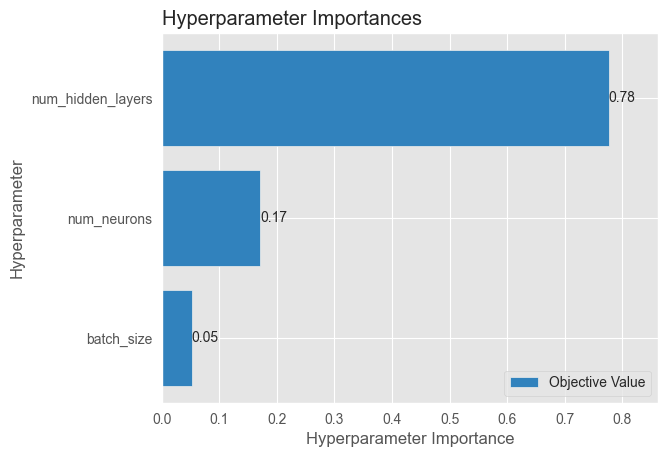

In [26]:
import optuna.visualization.matplotlib as mpl
import matplotlib.pyplot as plt

# Generate the plot
ax = mpl.plot_param_importances(study)

# Save the plot as a PNG file
ax.figure.savefig('graphs/param_importances_plot.png')

# Show the plot
plt.show()

C:\Users\user\AppData\Local\Temp\ipykernel_24540\1763563114.py:2: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = mpl.plot_optimization_history(study)


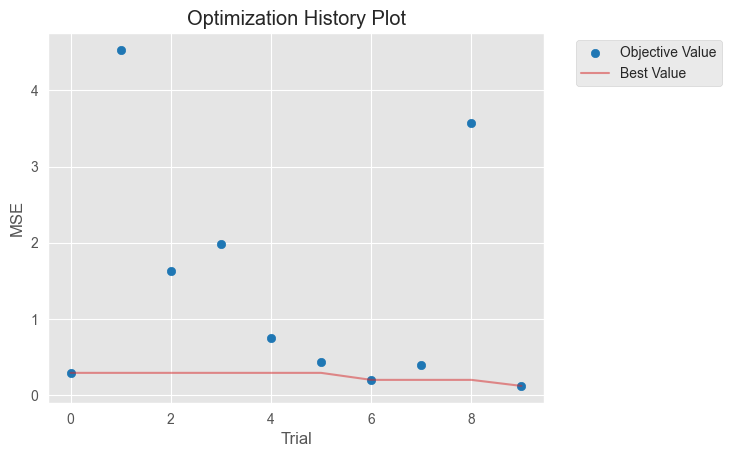

In [27]:
# Generate the plot
ax = mpl.plot_optimization_history(study)
# Set y-axis label
ax.set_ylabel('MSE')
# Save the plot as a PNG file
ax.figure.savefig('graphs/optimization_history_plot.png')

# Show the plot
plt.show()

C:\Users\user\AppData\Local\Temp\ipykernel_24540\3643952096.py:2: ExperimentalWarning: plot_parallel_coordinate is experimental (supported from v2.2.0). The interface can change in the future.
  ax = mpl.plot_parallel_coordinate(study,params=['num_hidden_layers','num_neurons','batch_size'])


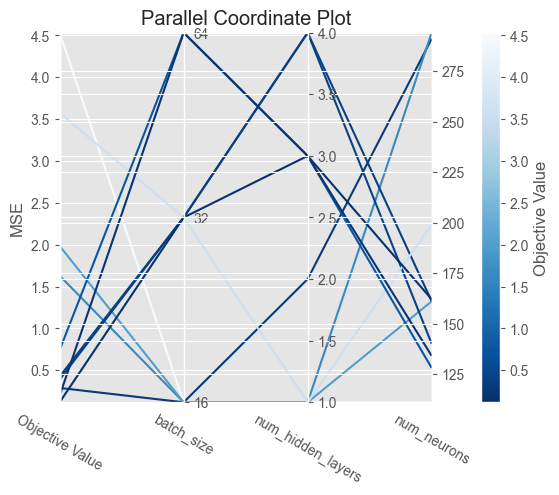

In [29]:
# Generate the plot
ax = mpl.plot_parallel_coordinate(study,params=['num_hidden_layers','num_neurons','batch_size'])
# Set y-axis label
ax.set_ylabel('MSE')
# Save the plot as a PNG file
ax.figure.savefig('graphs/parallel_coordinate_plot.png')

C:\Users\user\AppData\Local\Temp\ipykernel_24540\34165238.py:2: ExperimentalWarning: plot_slice is experimental (supported from v2.2.0). The interface can change in the future.
  fig = optuna.visualization.matplotlib.plot_slice(study, params=['num_hidden_layers','num_neurons','batch_size'])


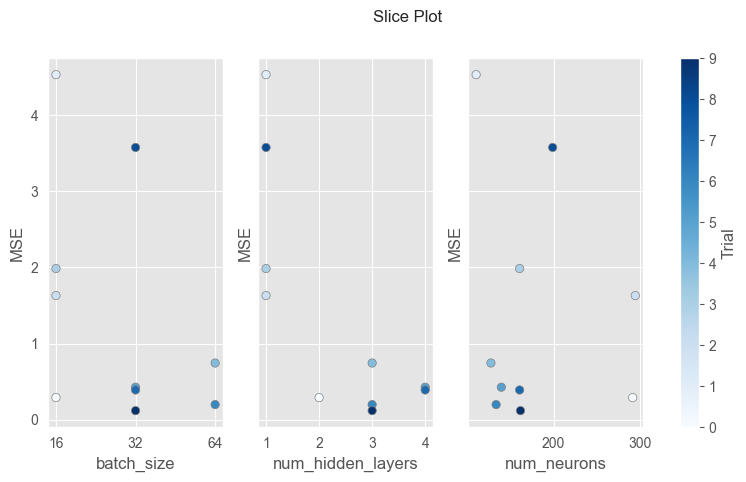

In [30]:
# Generate the plot
fig = optuna.visualization.matplotlib.plot_slice(study, params=['num_hidden_layers','num_neurons','batch_size'])

# Iterate over each axis and set the y-axis label
for ax in fig:
    ax.set_ylabel('MSE')

# Save the plot as a PNG file
fig[0].figure.savefig('graphs/slice_plot.png')

# Show the plot
plt.show()


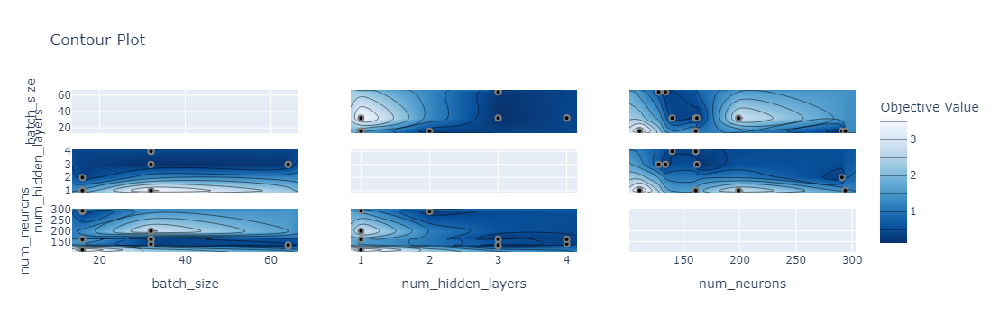

In [31]:
# Generate the plot
optuna.visualization.plot_contour(study,params=['num_hidden_layers','num_neurons','batch_size'])


# Update the Hyperparameters

In [32]:
best_num_hidden_layers=best_params['num_hidden_layers']
best_num_neurons=best_params['num_neurons']
best_batch_size=best_params['batch_size']

In [33]:
# Create and train the model
best_model = create_model(
    num_hidden_layers=best_num_hidden_layers, 
    num_neurons=best_num_neurons,  
    alpha=0.001, 
    beta1=0.9, 
    beta2=0.999, 
    epsilon=1e-8
)

In [34]:
best_history = best_model.fit(
        ANN_train_scaled_df, ANN_train_labels,
        batch_size=best_batch_size,
        validation_data=(ANN_validation_scaled_df, ANN_validation_labels),
        verbose=1,
        epochs=2000
        )

Epoch 1/2000
250/250 [==============================] - 1s 2ms/step - loss: 21615.4688 - mse: 21615.4688 - val_loss: 1278.0331 - val_mse: 1278.0331
Epoch 2/2000
250/250 [==============================] - 0s 1ms/step - loss: 1089.5266 - mse: 1089.5266 - val_loss: 785.2777 - val_mse: 785.2777
Epoch 3/2000
250/250 [==============================] - 0s 1ms/step - loss: 851.7196 - mse: 851.7196 - val_loss: 607.6240 - val_mse: 607.6240
Epoch 4/2000
250/250 [==============================] - 0s 1ms/step - loss: 638.8447 - mse: 638.8447 - val_loss: 425.1842 - val_mse: 425.1842
Epoch 5/2000
250/250 [==============================] - 0s 1ms/step - loss: 536.5819 - mse: 536.5819 - val_loss: 368.4313 - val_mse: 368.4313
Epoch 6/2000
250/250 [==============================] - 0s 1ms/step - loss: 479.7157 - mse: 479.7157 - val_loss: 322.5343 - val_mse: 322.5343
Epoch 7/2000
250/250 [==============================] - 0s 1ms/step - loss: 425.8274 - mse: 425.8274 - val_loss: 275.1857 - val_mse: 275.185

# Saving the Model

In [35]:
import os

# Define the directory where you want to save the model
save_dir = 'Forth_Tune'

# Make sure the directory exists, otherwise create it
os.makedirs(save_dir, exist_ok=True)

# Save the entire model
best_model.save(os.path.join(save_dir, 'best_model.h5'))

# Or save only the model architecture to JSON and the weights to HDF5
# Save model architecture as JSON
model_json = best_model.to_json()
with open(os.path.join(save_dir, "best_model.json"), "w") as json_file:
    json_file.write(model_json)

# Save model weights
best_model.save_weights(os.path.join(save_dir, "best_model_weights.h5"))


# Load the Saved Model

In [21]:
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error
import numpy as np
import os

# Load the model
from tensorflow.keras.models import load_model
model_path = 'Forth_Tune/best_model.h5'
loaded_model = load_model(model_path)

# Inspecting the Results

In [25]:
hist=pd.DataFrame(best_history.history)
hist['epoch']=best_history.epoch
hist.tail()

NameError: name 'best_history' is not defined

In [26]:
import matplotlib.pyplot as plt
import tensorflow_docs as tfdocs

# Assuming best_history is the history dictionary containing training and validation metrics
# Create the HistoryPlotter object
plotter = tfdocs.plots.HistoryPlotter(smoothing_std=10)

# Plot the history
plotter.plot({'Basic': best_history}, metric="mse")

# Customize the validation line to be red and solid
lines = plt.gca().lines
lines[-1].set_color('red')  # Assuming the validation line is the last line plotted
lines[-1].set_linestyle('-')  # Set the line style to solid

# Update the legend manually
plt.legend(['Training', 'Validation'], loc='upper right')

# Set y-axis limits
plt.ylim([0, 2000])

# Set y-axis label
plt.ylabel('MSE')

# Save the plot as a PNG file
plt.savefig('graphs/history_plot.png')

# Show the plot
plt.show()

NameError: name 'best_history' is not defined

In [22]:
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import root_mean_squared_error


# Assuming ANN_train_scaled_df and ANN_train_labels are your training data

# Predict labels for all samples
train_predictions = loaded_model.predict(ANN_train_scaled_df)

# Compute MSE, MAE, and MAPE for all predicted labels and true labels
mse_train = mean_squared_error(ANN_train_labels, train_predictions)
mse_train2 = root_mean_squared_error(ANN_train_labels, train_predictions)
mae_train = mean_absolute_error(ANN_train_labels, train_predictions)
mape_train = (1 - mean_absolute_percentage_error(ANN_train_labels, train_predictions)) * 100

print("Training MSE:", mse_train)
# print("Training MSE:", mse_train2)
# print("Training MAE:", mae_train)
print("Training Accuracy:", mape_train, "%")


250/250 [==============================] - 0s 773us/step
Training MSE: 0.28327229150433475
Training Accuracy: 99.88628024607196 %


In [23]:
from sklearn.metrics import mean_absolute_error

# Predict labels for all samples
validation_predictions = loaded_model.predict(ANN_validation_scaled_df)

# Compute MSE, MAE, and MAPE for all predicted labels and true labels
mse_validation = mean_squared_error(ANN_validation_labels, validation_predictions)
# mse_train2 = root_mean_squared_error(ANN_validation_labels, validation_predictions)
# mae_validation = mean_absolute_error(ANN_validation_labels, validation_predictions)
mape_validation = (1 - mean_absolute_percentage_error(ANN_validation_labels, validation_predictions)) * 100

print("Validation MSE:", mse_validation)
# print("Training MSE:", mse_train2)
# print("Validation MAE:", mae_validation)
print("Validation Accuracy:", mape_validation, "%")


32/32 [==============================] - 0s 1ms/step
Validation MSE: 0.32012856352336544
Validation Accuracy: 99.88102818186823 %


# Evaluating the Testing Set

In [24]:
from sklearn.metrics import mean_squared_error
import numpy as np

# Predict labels for all samples
test_predictions = loaded_model.predict(ANN_test_scaled_df)

# Compute MSE for all predicted labels and true labels
mse = mean_squared_error(ANN_test_labels, test_predictions)
mape_test = (1-mean_absolute_percentage_error(ANN_test_labels, test_predictions))*100
mae_test = mean_absolute_error(ANN_test_labels, test_predictions)

print("Testing MSE:", mse)
print("Testing accuracy:", mape_test, "%")
print("Testing MAE:", mae_test)

32/32 [==============================] - 0s 1ms/step
Testing MSE: 0.8037821530592111
Testing accuracy: 99.87431548410441 %
Testing MAE: 0.40950954406464846


32/32 [==============================] - 0s 1ms/step


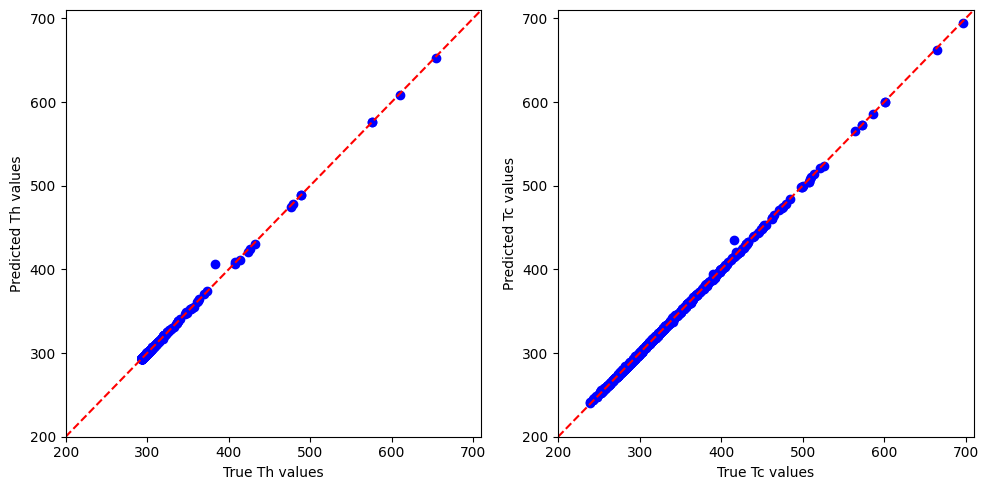

In [25]:
import matplotlib.pyplot as plt

# Assuming test_prediction, ANN_test_labels are Pandas DataFrames
test_prediction = loaded_model.predict(ANN_test_scaled_df)  # Using the predictions from the best model

# Extracting specific columns for Th and Tc predictions
Th_predictions = test_prediction[:, 0]
Tc_predictions = test_prediction[:, 1]

# Plotting
plt.figure(figsize=(10, 5))

# Plot Th predictions
plt.subplot(1, 2, 1)
plt.scatter(ANN_test_labels.iloc[:, 0], Th_predictions, color='blue')
plt.xlabel('True Th values')
plt.ylabel('Predicted Th values')
lims = [200, 710]
plt.xlim(lims)
plt.ylim(lims)
plt.plot(lims, lims, 'r--')

# Plot Tc predictions
plt.subplot(1, 2, 2)
plt.scatter(ANN_test_labels.iloc[:, 1], Tc_predictions, color='blue')
plt.xlabel('True Tc values')
plt.ylabel('Predicted Tc values')
plt.xlim(lims)
plt.ylim(lims)
plt.plot(lims, lims, 'r--')

plt.tight_layout()

# Save the plot as a PNG file
plt.savefig('graphs/prediction_plot.png')

plt.show()

# Create a DataFrame with the true and predicted values for Th and Tc
data = {
    'True Th values': ANN_test_labels.iloc[:, 0],
    'Predicted Th values': Th_predictions,
    'True Tc values': ANN_test_labels.iloc[:, 1],
    'Predicted Tc values': Tc_predictions
}
df = pd.DataFrame(data)

# Save the DataFrame to an Excel file
df.to_excel('Forth_Tune/pred_original.xlsx', index=False)

# Distribution of the Outputs

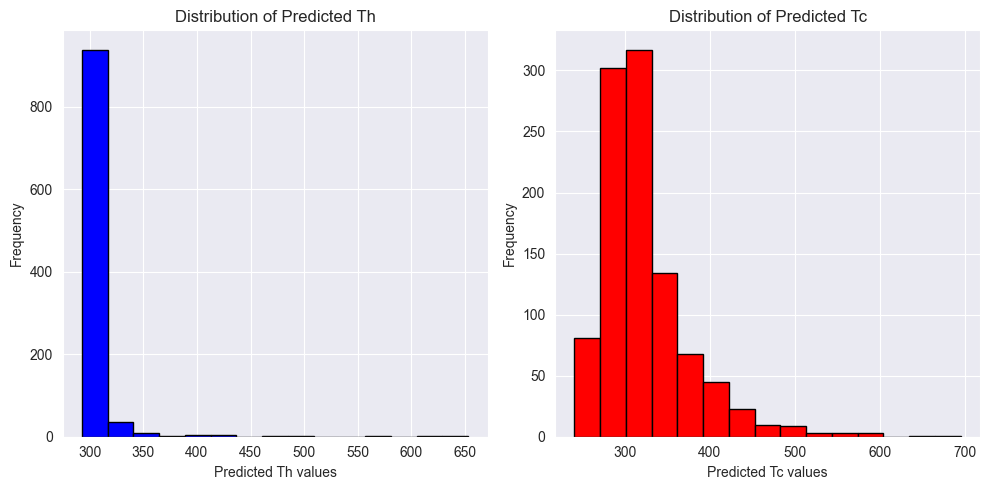

In [28]:
# Plotting Histograms
plt.figure(figsize=(10, 5))

# Plot histogram for Th predictions
plt.subplot(1, 2, 1)
plt.hist(Th_predictions, bins=15, color='blue', edgecolor='black')
plt.xlabel('Predicted Th values')
plt.ylabel('Frequency')
plt.title('Distribution of Predicted Th')

# Plot histogram for Tc predictions
plt.subplot(1, 2, 2)
plt.hist(Tc_predictions, bins=15, color='red', edgecolor='black')
plt.xlabel('Predicted Tc values')
plt.ylabel('Frequency')
plt.title('Distribution of Predicted Tc')

plt.tight_layout()

# Save the plot as a PNG file
plt.savefig('graphs/predicted_distribution.png')

plt.show()

# Create a DataFrame with the predicted Th and Tc values
predictions_data = pd.DataFrame({'Predicted_Th': Th_predictions, 'Predicted_Tc': Tc_predictions})

# Save the DataFrame to an Excel file
predictions_data.to_excel('Forth_Tune/predicted_values_histograms.xlsx', index=False)


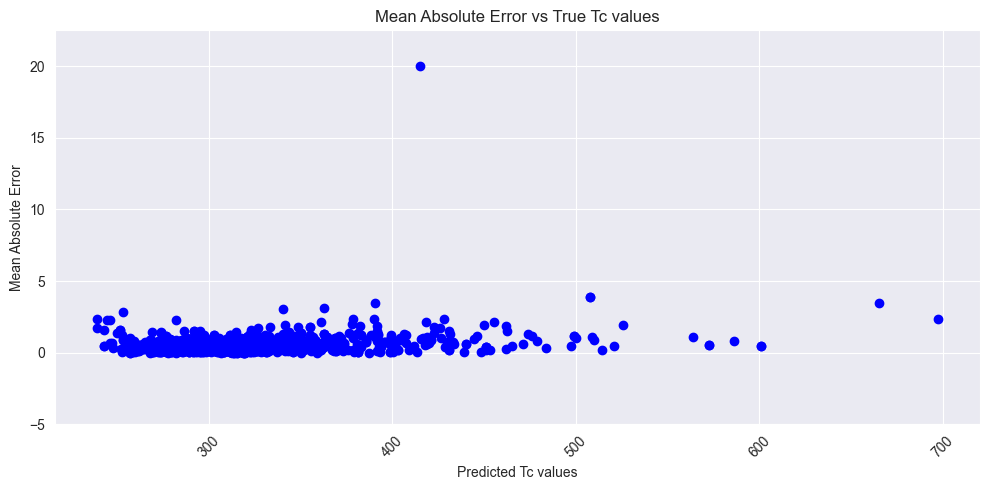

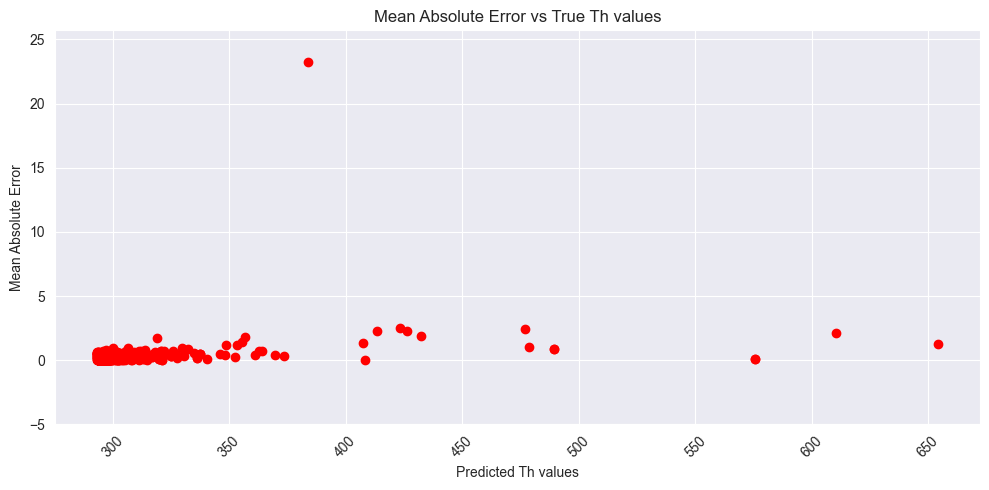

In [29]:
import numpy as np
from sklearn.metrics import mean_absolute_error

# Calculate Mean Absolute Error (MAE)
Th_true = ANN_test_labels.iloc[:, 0]
Tc_true = ANN_test_labels.iloc[:, 1]
Th_mae = np.abs(Th_true - Th_predictions)
Tc_mae = np.abs(Tc_true - Tc_predictions)

# Plot MAE vs Tc
plt.figure(figsize=(10, 5))
plt.scatter(Tc_true, Tc_mae, color='blue')
plt.xlabel('Predicted Tc values')
plt.ylabel('Mean Absolute Error')
plt.title('Mean Absolute Error vs True Tc values')
plt.grid(True)
plt.ylim(-5, max(Tc_mae) + 2.5)  # Set y-axis limit and ensure ticks start at 0
plt.xticks(rotation=45)  # Rotate x-axis labels for better visibility
plt.tight_layout()
plt.savefig('graphs/mae_vs_tc.png')
plt.show()

# Plot MAE vs Th
plt.figure(figsize=(10, 5))
plt.scatter(Th_true, Th_mae, color='red')
plt.xlabel('Predicted Th values')
plt.ylabel('Mean Absolute Error')
plt.title('Mean Absolute Error vs True Th values')
plt.grid(True)
plt.ylim(-5, max(Th_mae) + 2.5)  # Set y-axis limit and ensure ticks start at 0
plt.xticks(rotation=45)  # Rotate x-axis labels for better visibility
plt.tight_layout()
plt.savefig('graphs/mae_vs_th.png')
plt.show()


# Varying Qc/A [1000,5000,10000,15000,20000] and I

In [37]:
import time
import pandas as pd

start_time = time.time()

# Define the lists of values for parameters
current_values = [i / 1 for i in range(1, 31)]  # Current values from 0.1 to 30 with a resolution of 0.1
Qc_A_values = [2000,5000,10000,15000,20000]  # Qc/A values to vary

# Create an empty list to store predictions
predictions_list = []

# Define the fixed values for Wn, HTE, and h
Wn = 6
HTE = 2.5
h = 2500

# Loop through each value of Qc/A
for Qc_A in Qc_A_values:
    # Loop through each value of current I
    for I in current_values:
        # Create a DataFrame with the input parameters
        input_data = pd.DataFrame({
            'Wn': [Wn],
            'HTE': [HTE],
            'I': [I],
            'h': [h],
            'Qc/A': [Qc_A]
        })

        # Scale the input data using the previously fitted scaler
        input_data_scaled = scaler.transform(input_data)

        # Make predictions for Tc and Th
        predictions = loaded_model.predict(input_data_scaled)

        # Extract predicted values
        predicted_Th = predictions[0][0]
        predicted_Tc = predictions[0][1]

        # Append the results to the list
        predictions_list.append({
            'I': I,
            'Qc/A': Qc_A,
            'Predicted_Th': predicted_Th,
            'Predicted_Tc': predicted_Tc
        })

# Convert the list to a DataFrame
predictions_df = pd.DataFrame(predictions_list)

# Save the DataFrame to an Excel file
predictions_df.to_excel('Forth_Tune/predictions_varied_Qc_A2.xlsx', index=False)

end_time = time.time()
print("Time taken:", end_time - start_time, "seconds")


1/1 [==============================] - 0s 16ms/step
Time taken: 8.659540176391602 seconds


# Varying h [100,1000,2500,5000,10000] and I

In [33]:
import pandas as pd
import time

start_time = time.time()

# Define the lists of values for parameters
current_values = [i / 10 for i in range(1, 301)]  # Current values from 0.1 to 30 with a resolution of 0.1
h_values = [50, 100, 300, 500, 1000,2500,8000,9000,11000]  # h values to vary

# Create an empty list to store predictions
predictions_list = []

# Define the fixed values for Wn, HTE, and Qc/A
Wn = 6
HTE = 2.5
Qc_A = 10000

# Loop through each value of h
for h in h_values:
    # Loop through each value of current I
    for I in current_values:
        # Create a DataFrame with the input parameters
        input_data = pd.DataFrame({
            'Wn': [Wn],
            'HTE': [HTE],
            'I': [I],
            'h': [h],
            'Qc/A': [Qc_A]
        })

        # Scale the input data using the previously fitted scaler
        input_data_scaled = scaler.transform(input_data)

        # Make predictions for Tc and Th
        predictions = loaded_model.predict(input_data_scaled)

        # Extract predicted values
        predicted_Th = predictions[0][0]
        predicted_Tc = predictions[0][1]

        # Append the results to the list
        predictions_list.append({
            'I': I,
            'h': h,
            'Predicted_Th': predicted_Th,
            'Predicted_Tc': predicted_Tc
        })

# Convert the list to a DataFrame
predictions_df = pd.DataFrame(predictions_list)

# Save the DataFrame to an Excel file
predictions_df.to_excel('Forth_Tune/predictions_varied_h2.xlsx', index=False)

end_time = time.time()
print("Time taken:", end_time - start_time, "seconds")


1/1 [==============================] - 0s 17ms/step
Time taken: 134.05862069129944 seconds


# Varying Wn [4,5,6,7,8] and I

In [29]:
import pandas as pd
import time

start_time = time.time()

# Define the lists of values for parameters
current_values = [i / 1 for i in range(1, 31)]  # Current values from 0.1 to 30 with a resolution of 0.1
Wn_values = [2,3,4, 5, 6, 7, 8]  # Wn values to vary

# Create an empty list to store predictions
predictions_list = []

# Define the fixed values for HTE, Qc/A, and h
HTE = 2.5
Qc_A = 10000
h = 2500

# Loop through each value of Wn
for Wn in Wn_values:
    # Loop through each value of current I
    for I in current_values:
        # Create a DataFrame with the input parameters
        input_data = pd.DataFrame({
            'Wn': [Wn],
            'HTE': [HTE],
            'I': [I],
            'h': [h],
            'Qc/A': [Qc_A]
        })

        # Scale the input data using the previously fitted scaler
        input_data_scaled = scaler.transform(input_data)

        # Make predictions for Tc and Th
        predictions = loaded_model.predict(input_data_scaled)

        # Extract predicted values
        predicted_Th = predictions[0][0]
        predicted_Tc = predictions[0][1]

        # Append the results to the list
        predictions_list.append({
            'I': I,
            'Wn': Wn,
            'Predicted_Th': predicted_Th,
            'Predicted_Tc': predicted_Tc
        })

# Convert the list to a DataFrame
predictions_df = pd.DataFrame(predictions_list)

# Save the DataFrame to an Excel file
predictions_df.to_excel('Forth_Tune/predictions_varied_Wn2.xlsx', index=False)

end_time = time.time()
print("Time taken:", end_time - start_time, "seconds")


1/1 [==============================] - 0s 17ms/step
Time taken: 10.119253396987915 seconds


# Varying HTE[0.5,1.5,2.5,3.5,4.5] and I

In [31]:
import pandas as pd
import time

start_time = time.time()

# Define the lists of values for parameters
current_values = [i / 1 for i in range(1, 31)]  # Current values from 0.1 to 30 with a resolution of 0.1
HTE_values = [0.5, 1.5, 2.5, 3.5, 4.5,5.5,6.5]  # HTE values to vary

# Create an empty list to store predictions
predictions_list = []

# Define the fixed values for Wn, Qc/A, and h
Wn = 6
Qc_A = 10000
h = 2500

# Loop through each value of HTE
for HTE in HTE_values:
    # Loop through each value of current I
    for I in current_values:
        # Create a DataFrame with the input parameters
        input_data = pd.DataFrame({
            'Wn': [Wn],
            'HTE': [HTE],
            'I': [I],
            'h': [h],
            'Qc/A': [Qc_A]
        })

        # Scale the input data using the previously fitted scaler
        input_data_scaled = scaler.transform(input_data)

        # Make predictions for Tc and Th
        predictions = loaded_model.predict(input_data_scaled)

        # Extract predicted values
        predicted_Th = predictions[0][0]
        predicted_Tc = predictions[0][1]

        # Append the results to the list
        predictions_list.append({
            'I': I,
            'HTE': HTE,
            'Predicted_Th': predicted_Th,
            'Predicted_Tc': predicted_Tc
        })

# Convert the list to a DataFrame
predictions_df = pd.DataFrame(predictions_list)

# Save the DataFrame to an Excel file
predictions_df.to_excel('Forth_Tune/predictions_varied_HTE1.xlsx', index=False)

end_time = time.time()
print("Time taken:", end_time - start_time, "seconds")


1/1 [==============================] - 0s 17ms/step
Time taken: 10.84039831161499 seconds


# Varying Qc/A 

In [27]:
import pandas as pd
import time
start_time = time.time()

# Define the list of values for Qc/A
Qc_A_values = list(range(1000, 21000, 100))  # Qc/A values from 1000 to 20000 with a resolution of 100

# Create an empty list to store predictions
predictions_list = []

# Define the fixed values for Wn, HTE, h, and I
Wn = 6
HTE = 2.5
h = 2500
I = 15  # Current fixed at 15A

# Loop through each value of Qc/A
for Qc_A in Qc_A_values:
    # Create a DataFrame with the input parameters
    input_data = pd.DataFrame({
        'Wn': [Wn],
        'HTE': [HTE],
        'I': [I],
        'h': [h],
        'Qc/A': [Qc_A]
    })

    # Scale the input data using the previously fitted scaler
    input_data_scaled = scaler.transform(input_data)

    # Make predictions for Tc and Th
    predictions = loaded_model.predict(input_data_scaled)

    # Extract predicted values
    predicted_Th = predictions[0][0]
    predicted_Tc = predictions[0][1]

    # Append the results to the list
    predictions_list.append({
        'I': I,
        'Qc/A': Qc_A,
        'Predicted_Th': predicted_Th,
        'Predicted_Tc': predicted_Tc
    })

# Convert the list to a DataFrame
predictions_df = pd.DataFrame(predictions_list)

# Save the DataFrame to an Excel file
predictions_df.to_excel('Results/Qc/predictions_fixed_I_varied_Qc_A.xlsx', index=False)

end_time = time.time()
print("Time taken:", end_time - start_time, "seconds")


1/1 [==============================] - 0s 17ms/step
Time taken: 10.113399744033813 seconds


# Varying h

In [28]:
import pandas as pd
import time

start_time = time.time()

# Define the list of values for h
h_values = list(range(100, 10100, 50))  # h values from 100 to 10000 with a resolution of 50

# Create an empty list to store predictions
predictions_list = []

# Define the fixed values for Wn, HTE, Qc/A, and I
Wn = 6
HTE = 2.5
Qc_A = 10000
I = 15  # Current fixed at 15A

# Loop through each value of h
for h in h_values:
    # Create a DataFrame with the input parameters
    input_data = pd.DataFrame({
        'Wn': [Wn],
        'HTE': [HTE],
        'I': [I],
        'h': [h],
        'Qc/A': [Qc_A]
    })

    # Scale the input data using the previously fitted scaler
    input_data_scaled = scaler.transform(input_data)

    # Make predictions for Tc and Th
    predictions = loaded_model.predict(input_data_scaled)

    # Extract predicted values
    predicted_Th = predictions[0][0]
    predicted_Tc = predictions[0][1]

    # Append the results to the list
    predictions_list.append({
        'I': I,
        'h': h,
        'Predicted_Th': predicted_Th,
        'Predicted_Tc': predicted_Tc
    })

# Convert the list to a DataFrame
predictions_df = pd.DataFrame(predictions_list)

# Save the DataFrame to an Excel file
predictions_df.to_excel('Results/h/predictions_fixed_Qc_A_varied_h.xlsx', index=False)

end_time = time.time()
print("Time taken:", end_time - start_time, "seconds")


1/1 [==============================] - 0s 17ms/step
Time taken: 10.019853353500366 seconds


# Vary I

In [29]:
import pandas as pd
import time

start_time = time.time()

# Define the list of values for I
current_values = [i / 10.0 for i in range(1, 301)]  # Current values from 0.1 to 30 with a resolution of 0.1

# Create an empty list to store predictions
predictions_list = []

# Define the fixed values for Wn, HTE, Qc/A, and h
Wn = 6
HTE = 2.5
Qc_A = 10000
h = 2500

# Loop through each value of I
for I in current_values:
    # Create a DataFrame with the input parameters
    input_data = pd.DataFrame({
        'Wn': [Wn],
        'HTE': [HTE],
        'I': [I],
        'h': [h],
        'Qc/A': [Qc_A]
    })

    # Scale the input data using the previously fitted scaler
    input_data_scaled = scaler.transform(input_data)

    # Make predictions for Tc and Th
    predictions = loaded_model.predict(input_data_scaled)

    # Extract predicted values
    predicted_Th = predictions[0][0]
    predicted_Tc = predictions[0][1]

    # Append the results to the list
    predictions_list.append({
        'I': I,
        'Predicted_Th': predicted_Th,
        'Predicted_Tc': predicted_Tc
    })

# Convert the list to a DataFrame
predictions_df = pd.DataFrame(predictions_list)

# Save the DataFrame to an Excel file
predictions_df.to_excel('Results/I/predictions_fixed_h_varied_I.xlsx', index=False)

end_time = time.time()
print("Time taken:", end_time - start_time, "seconds")


1/1 [==============================] - 0s 17ms/step
Time taken: 14.642578840255737 seconds


# Vary Wn

In [30]:
import pandas as pd
import time

start_time = time.time()

# Define the list of values for Wn
Wn_values = [i / 100.0 for i in range(400, 801, 5)]  # Wn values from 4 to 8 with a resolution of 0.05

# Create an empty list to store predictions
predictions_list = []

# Define the fixed values for HTE, Qc/A, h, and I
HTE = 2.5
Qc_A = 10000
h = 2500
I = 15

# Loop through each value of Wn
for Wn in Wn_values:
    # Create a DataFrame with the input parameters
    input_data = pd.DataFrame({
        'Wn': [Wn],
        'HTE': [HTE],
        'I': [I],
        'h': [h],
        'Qc/A': [Qc_A]
    })

    # Scale the input data using the previously fitted scaler
    input_data_scaled = scaler.transform(input_data)

    # Make predictions for Tc and Th
    predictions = loaded_model.predict(input_data_scaled)

    # Extract predicted values
    predicted_Th = predictions[0][0]
    predicted_Tc = predictions[0][1]

    # Append the results to the list
    predictions_list.append({
        'Wn': Wn,
        'Predicted_Th': predicted_Th,
        'Predicted_Tc': predicted_Tc
    })

# Convert the list to a DataFrame
predictions_df = pd.DataFrame(predictions_list)

# Save the DataFrame to an Excel file
predictions_df.to_excel('Results/Wn/predictions_fixed_I_varied_Wn.xlsx', index=False)

end_time = time.time()
print("Time taken:", end_time - start_time, "seconds")


1/1 [==============================] - 0s 16ms/step
Time taken: 4.008938550949097 seconds


# Vary HTE

In [31]:
import pandas as pd
import time

start_time = time.time()

# Define the list of values for HTE
HTE_values = [i / 20.0 for i in range(5, 91)]  # HTE values from 0.5 to 4.5 with a resolution of 0.05

# Create an empty list to store predictions
predictions_list = []

# Define the fixed values for Wn, Qc/A, h, and I
Wn = 6
Qc_A = 10000
h = 2500
I = 15

# Loop through each value of HTE
for HTE in HTE_values:
    # Create a DataFrame with the input parameters
    input_data = pd.DataFrame({
        'Wn': [Wn],
        'HTE': [HTE],
        'I': [I],
        'h': [h],
        'Qc/A': [Qc_A]
    })

    # Scale the input data using the previously fitted scaler
    input_data_scaled = scaler.transform(input_data)

    # Make predictions for Tc and Th
    predictions = loaded_model.predict(input_data_scaled)

    # Extract predicted values
    predicted_Th = predictions[0][0]
    predicted_Tc = predictions[0][1]

    # Append the results to the list
    predictions_list.append({
        'HTE': HTE,
        'Predicted_Th': predicted_Th,
        'Predicted_Tc': predicted_Tc
    })

# Convert the list to a DataFrame
predictions_df = pd.DataFrame(predictions_list)

# Save the DataFrame to an Excel file
predictions_df.to_excel('Results/HTE/predictions_fixed_Wn_varied_HTE.xlsx', index=False)

end_time = time.time()
print("Time taken:", end_time - start_time, "seconds")


1/1 [==============================] - 0s 15ms/step
Time taken: 4.688264608383179 seconds


# 3D Contour Plots

In [ ]:
import pandas as pd
import time

start_time = time.time()

# Define the list of values for Wn and HTE
Wn_values = [i / 20.0 for i in range(80, 161)]  # Wn values from 4 to 8 with a resolution of 0.05
HTE_values = [i / 20.0 for i in range(10, 91)]  # HTE values from 0.5 to 4.5 with a resolution of 0.05

# Create an empty list to store predictions
predictions_list = []

# Define the fixed values for Qc/A, h
Qc_A = 10000
h = 2500

# Loop through each combination of Wn and HTE
for Wn in Wn_values:
    for HTE in HTE_values:
        min_Tc = float('inf')  # Initialize minimum Tc to positive infinity
        optimal_current = None  # Initialize optimal current
        
        # Loop through each value of current I from 1 to 30A with a resolution of 1A
        for I in range(1, 31):
            # Create a DataFrame with the input parameters
            input_data = pd.DataFrame({
                'Wn': [Wn],
                'HTE': [HTE],
                'I': [I],
                'h': [h],
                'Qc/A': [Qc_A]
            })

            # Scale the input data using the previously fitted scaler
            input_data_scaled = scaler.transform(input_data)

            # Make predictions for Tc and Th
            predictions = loaded_model.predict(input_data_scaled)

            # Extract predicted values
            predicted_Th = predictions[0][0]
            predicted_Tc = predictions[0][1]

            # Check if the current I gives the lowest Tc so far
            if predicted_Tc < min_Tc:
                min_Tc = predicted_Tc
                optimal_current = I

        # Store the results for the combination of Wn and HTE with the optimum current
        predictions_list.append({
            'Wn': Wn,
            'HTE': HTE,
            'Optimal_Current': optimal_current,
            'Predicted_Th': predictions[0][0],  # Th for the optimum current
            'Predicted_Tc': predictions[0][1]   # Tc for the optimum current
        })

# Convert the list to a DataFrame
predictions_df = pd.DataFrame(predictions_list)

# Save the DataFrame to an Excel file
predictions_df.to_excel('Results3/Wn_HTE/optimum.xlsx', index=False)

end_time = time.time()
print("Time taken:", end_time - start_time, "seconds")


1/1 [==============================] - 0s 16ms/step


IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



1/1 [==============================] - 0s 17ms/step


IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



1/1 [==============================] - 0s 17ms/step


IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



1/1 [==============================] - 0s 17ms/step


IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



1/1 [==============================] - 0s 18ms/step


IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



1/1 [==============================] - 0s 18ms/step


IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



1/1 [==============================] - 0s 19ms/step
